## Imports

In [1]:
import cv2
import keras
from keras.applications.imagenet_utils import preprocess_input
from keras.backend.tensorflow_backend import set_session
from keras.models import Model
from keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
from scipy.misc import imread
import tensorflow as tf
import glob
import imagehash
from __future__ import (absolute_import, division, print_function)
from PIL import Image
import six
from sklearn.preprocessing import LabelEncoder
import imagehash
from ssd import SSD300
from ssd_utils import BBoxUtility
import subprocess
import pandas as pd

%matplotlib inline
plt.rcParams['figure.figsize'] = (8, 8)
plt.rcParams['image.interpolation'] = 'nearest'

np.set_printoptions(suppress=True)

config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.45
set_session(tf.Session(config=config))

## functions

In [2]:
def draw_ssd_img(i,img):
    
    persons=0
    #z = fig.add_subplot(3,3,i+1)
    
    det_label = results[i][:, 0]
    det_conf = results[i][:, 1]
    det_xmin = results[i][:, 2]
    det_ymin = results[i][:, 3]
    det_xmax = results[i][:, 4]
    det_ymax = results[i][:, 5]

    # Get detections with confidence higher than 0.6.
    top_indices = [i for i, conf in enumerate(det_conf) if conf >= 0.6]

    top_conf = det_conf[top_indices]
    top_label_indices = det_label[top_indices].tolist()
    top_xmin = det_xmin[top_indices]
    top_ymin = det_ymin[top_indices]
    top_xmax = det_xmax[top_indices]
    top_ymax = det_ymax[top_indices]

    colors = plt.cm.hsv(np.linspace(0, 1, 21)).tolist()

    plot(img)
    currentAxis = plt.gca()
    #print (top_indices,results)
    for i in range(top_conf.shape[0]):
        xmin = int(round(top_xmin[i] * img.shape[1]))
        ymin = int(round(top_ymin[i] * img.shape[0]))
        xmax = int(round(top_xmax[i] * img.shape[1]))
        ymax = int(round(top_ymax[i] * img.shape[0]))
        score = top_conf[i]
        label = int(top_label_indices[i])
        label_name = voc_classes[label - 1]
        if label_name=='Person':
            persons+=1
        display_txt = '{:0.2f}, {}'.format(score, label_name)
        coords = (xmin, ymin), xmax-xmin+1, ymax-ymin+1
        color = colors[label]
        currentAxis.add_patch(plt.Rectangle(*coords, fill=False, edgecolor=color, linewidth=2))
        currentAxis.text(xmin, ymin, display_txt, bbox={'facecolor':color, 'alpha':0.5})
    print('# persons:' ,persons)
    plt.show()
    

In [3]:
def to_plot(img):
    return np.rollaxis(img, 0, 3).astype(np.uint8)
def plot(img):
    plt.imshow((img))

## SSD stuff

In [4]:
voc_classes = ['Aeroplane', 'Bicycle', 'Bird', 'Boat', 'Bottle',
               'Bus', 'Car', 'Cat', 'Chair', 'Cow', 'Diningtable',
               'Dog', 'Horse','Motorbike', 'Person', 'Pottedplant',
               'Sheep', 'Sofa', 'Train', 'Tvmonitor']

NUM_CLASSES = len(voc_classes) + 1

In [6]:
input_shape=(300, 300, 3)
model = SSD300(input_shape, num_classes=NUM_CLASSES)
model.load_weights('/mnt/weights_SSD300.hdf5', by_name=True)
bbox_util = BBoxUtility(NUM_CLASSES)

In [11]:
cd /mnt

/mnt


In [12]:
with open('model.json', 'w') as f:
    f.write(model.to_json())

In [7]:
#load fish
% cd /mnt/kaggle_fisherman/train/
g=glob.glob('*/*.*')
pics=np.random.choice(g,5,replace=False)

/mnt/kaggle_fisherman/train


In [8]:
#ski movie pics
% cd /mnt/vidme/vid1/
g=glob.glob('*.png')
pics=np.random.choice(g,len(g),replace=False)

/mnt/vidme/vid1


In [ ]:
sample_files=['./pics/fish-bike.jpg','./pics/cat.jpg','./pics/boys.jpg','./pics/car_cat.jpg','./pics/car_cat2.jpg']

In [10]:
pics

array(['out669.png', 'out810.png', 'out630.png', ..., 'out708.png',
       'out701.png', 'out421.png'], 
      dtype='<U11')

In [15]:
cd /mnt/vidme/vid1/

/mnt/vidme/vid1


In [16]:
pre_inputs = []
images = []

for pic in pics:
    img = image.load_img(pic, target_size=(300, 300))
    img = image.img_to_array(img)
    images.append(imread(pic))
    pre_inputs.append(img.copy())
inputs = preprocess_input(np.array(pre_inputs))

In [18]:
inputs.shape

(1056, 300, 300, 3)

In [19]:
preds = model.predict(inputs, batch_size=1, verbose=1)

1056/1056 [==============================] - 68s       

In [21]:
preds.shape

(1056, 7308, 33)

In [184]:
results = bbox_util.detection_out(preds)
results[0][0]

array([ 15.        ,   0.2305297 ,   0.07350111,   0.04652482,
         0.89077795,   0.97275287])

In [185]:
#%%time
#a = model.predict(inputs, batch_size=1)
#b = bbox_util.detection_out(preds)

results - images X items X [type (according list), confidence, x_min, y_min, x_max, y_max]

# persons: 0


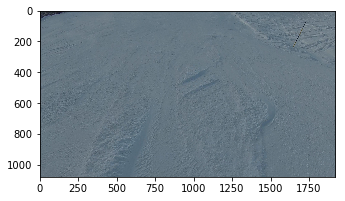

# persons: 1


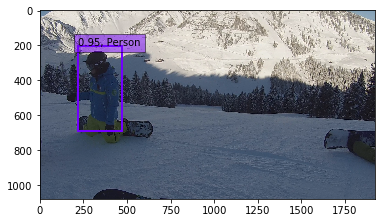

# persons: 2


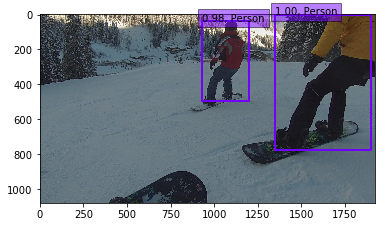

# persons: 0


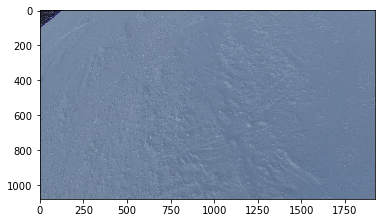

# persons: 1


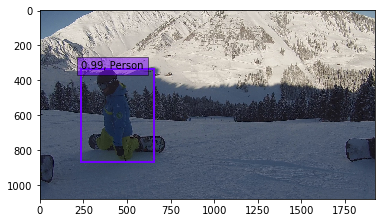

# persons: 0


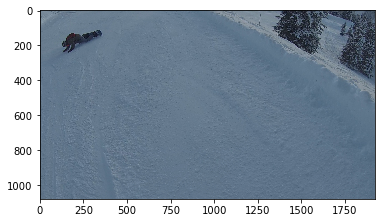

# persons: 0


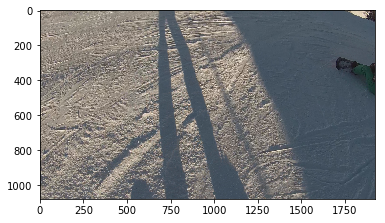

# persons: 1


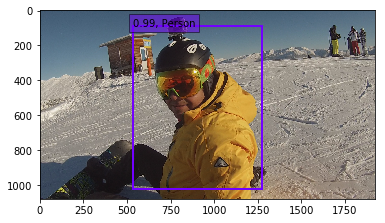

# persons: 1


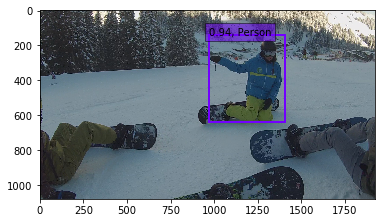

ValueError: num must be 1 <= num <= 9, not 10

In [243]:

%%time
fig = plt.figure( figsize=(18, 18))

for i, img in enumerate(images):
    
    draw_ssd_img(i,img)


## here i use yolo which is more accurate currenlty

In [26]:
def run_yolo(i):
    subprocess.check_output(['/mnt/darknet/darknet','detect','/mnt/darknet/cfg/yolo.cfg','/mnt/darknet/cfg/yolo.weights',path+'out'+str(i)+'.png'])

In [23]:
pic_nums=[pic.split('.')[0].split('t')[1] for pic in pics]

In [24]:
pic_nums

['669',
 '810',
 '630',
 '622',
 '155',
 '70',
 '151',
 '881',
 '260',
 '1017',
 '793',
 '118',
 '285',
 '632',
 '91',
 '235',
 '594',
 '1007',
 '537',
 '103',
 '293',
 '323',
 '655',
 '504',
 '835',
 '92',
 '502',
 '423',
 '729',
 '862',
 '715',
 '565',
 '252',
 '536',
 '147',
 '972',
 '747',
 '984',
 '73',
 '794',
 '1002',
 '551',
 '251',
 '47',
 '443',
 '205',
 '491',
 '842',
 '239',
 '739',
 '3',
 '418',
 '289',
 '271',
 '917',
 '391',
 '582',
 '736',
 '756',
 '383',
 '135',
 '441',
 '331',
 '702',
 '1021',
 '165',
 '163',
 '806',
 '202',
 '102',
 '190',
 '419',
 '156',
 '867',
 '974',
 '869',
 '923',
 '910',
 '831',
 '80',
 '2',
 '415',
 '1034',
 '123',
 '920',
 '107',
 '687',
 '270',
 '542',
 '786',
 '18',
 '997',
 '50',
 '424',
 '930',
 '991',
 '883',
 '838',
 '23',
 '396',
 '758',
 '144',
 '320',
 '646',
 '826',
 '392',
 '799',
 '813',
 '554',
 '12',
 '643',
 '798',
 '681',
 '462',
 '816',
 '971',
 '169',
 '339',
 '311',
 '429',
 '348',
 '413',
 '1020',
 '1055',
 '516',
 '131',

In [28]:
path='/mnt/vidme/vid1/'
yolo_path='/mnt/darknet/'

In [35]:
cd /mnt/darknet/

/mnt/darknet


In [34]:
df

,object,conf,left,right,top,bottom
0,person,28.089016,459,516,22,100


run yolo on images, output coordinate dataframe

669
# of people 4
810
# of people 1
630
# of people 2
622
# of people 1
155
# of people 1
70
# of people 2
151
# of people 1
881
# of people 5
260
# of people 5
1017
# of people 0
793
# of people 0
118
# of people 2
285
# of people 1
632
# of people 1
91
# of people 5
235
# of people 5


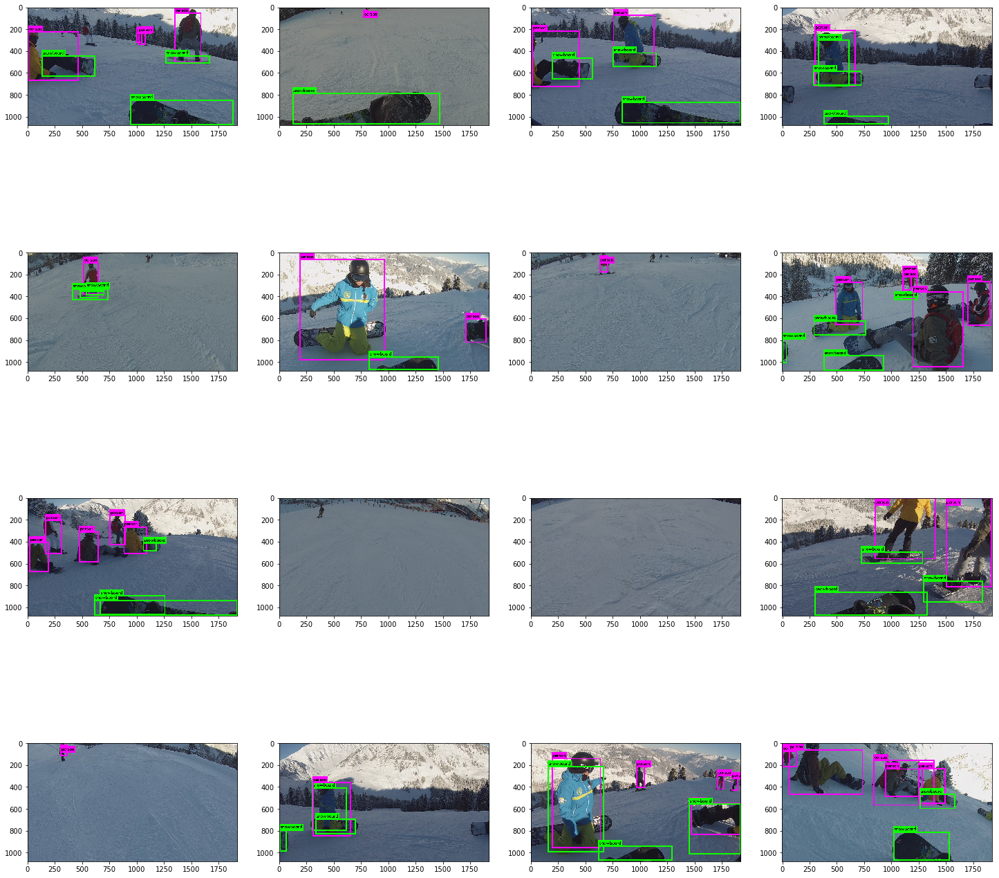

In [36]:
#%%time


fig = plt.figure( figsize=(25, 25))

image_series=[]
full_df=pd.DataFrame()

j=1
for i in pic_nums[:16]:
    z = fig.add_subplot(4,4,j)
    run_yolo(i)
    print (i)
    try:
        df=pd.read_csv(yolo_path+'output.txt',header=None)
        full_df=full_df.append(df)
        image_series=image_series+[i]*len(df)
        df.columns=['object','conf','left','right','top','bottom']
        person_count=len(df[df.object=='person'])
    except:
        person_count=0
    print ('# of people',person_count)
    im=cv2.imread(yolo_path+'predictions.png')
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plot(im)
    j+=1
    
full_df[6]=image_series
full_df.columns=['object','conf','left','right','top','bottom','image_id']
#plt.imshow(im[:,:,::-1])

extract persons out of detected imagelist

output them as files in persons folder

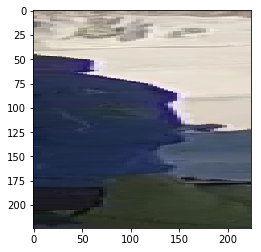

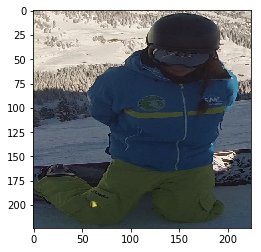

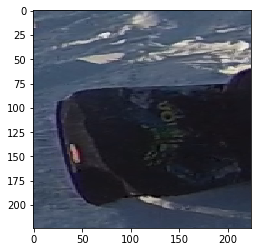

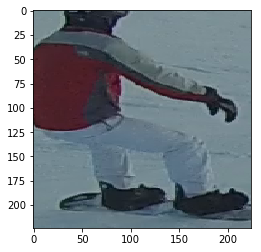

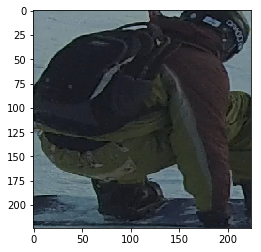

...

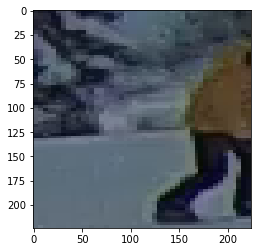

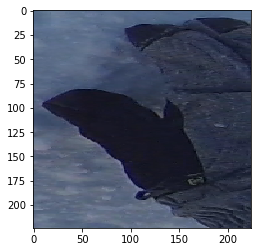

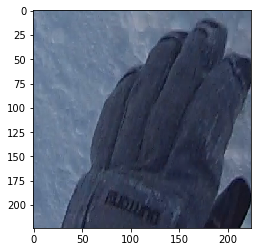

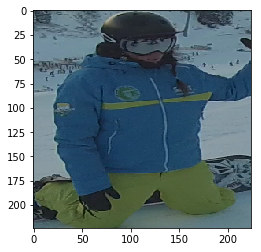

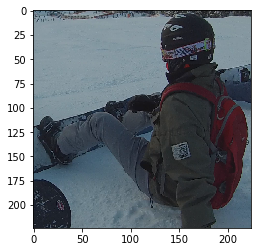

In [437]:

person_pic_name='resized'
person_img_list=[]
for i,attributes in enumerate(full_df[full_df.object=='person'].iterrows()):
    #print (attributes)
    pic='/mnt/vidme/vid1/out'+attributes[1][6]+'.png'
    img = image.load_img(pic)
    a=img.crop([attributes[1][2],attributes[1][4],attributes[1][3],attributes[1][5]])
    resized=a.resize([224,224])
    plot(resized)
    person_img_list.append(resized)
    resized.save('/mnt/vidme/vid1/persons/'+person_pic_name+str(i)+'.png')
    plt.show()

## try image hash - simple library for iamge clustering

In [8]:
% cd /mnt/vidme/vid1/

/mnt/vidme/vid1


In [10]:
hash = imagehash.average_hash(Image.open('out653.png'))
otherhash = imagehash.average_hash(Image.open('/mnt/vidme/vid1/out651.png'))

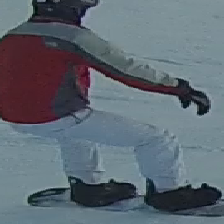

In [12]:
Image.open('/mnt/vidme/vid1/persons/resized3.png')

/mnt/vidme/vid1/persons


In [18]:
%cd /mnt/vidme/vid1/persons
t_1=pd.read_csv('taggings_1.csv',delimiter=' ')
t_2=pd.read_csv('taggings_2.csv',header=None)
ind=[i for i in range(62,62+len(t_2))]
t_2['ind']=ind
t_2.columns=['person','id']
taggings=t_1.append(t_2)

In [19]:
le=LabelEncoder()
taggings['encoding']=le.fit_transform(taggings['person'])

In [22]:
from collections import Counter
indices={key: [] for key in Counter(taggings['person']).keys()}
for row in taggings.iterrows():
    indices[row[1][1]].append(row[1][0])

In [23]:
#!/usr/bin/env python


"""
Demo of hashing
"""
def find_similar_images(userpath, hashfunc = imagehash.average_hash):
    import os
    def is_image(filename):
        
        f = filename.lower()
        is_image=f.endswith(".png") or f.endswith(".jpg") or f.endswith(".jpeg") or f.endswith(".bmp") or f.endswith(".gif")
        return is_image
    
    image_filenames = [os.path.join(userpath, path) for path in os.listdir(userpath) if is_image(path)]
    images = {}
    for img in sorted(image_filenames):
        hash = hashfunc(Image.open(img))
        a=img.split('.')[0] #'/mnt/vidme/vid1/persons/resized0.png'
        img_num=a.split('resized')[1]
        images[hash] = images.get(hash, []) + [img_num]
    
    for k, img_list in six.iteritems(images):
        if len(img_list) > 1:
            print(" ".join(img_list))
    
    return images

In [24]:
hash = imagehash.average_hash(Image.open('/mnt/vidme/vid1/persons/resized3.png'))
print(hash)

f9f8e0b8f8ff0301


In [25]:
dic=find_similar_images('/mnt/vidme/vid1/persons/')

In [283]:
#arrange the hashes in a nice way
dif_dict={}
dist_matrix=[]
i=0
for hash_1,im_1 in six.iteritems(dic):
    dist_matrix.append([])
   
    for hash_2,im_2 in six.iteritems(dic):
        dif=hash_1-hash_2
        dist_matrix[i].append(dif)
        if dif!=0:
            dif_dict[(im_1[0],im_2[0])]=dif
    i+=1

In [298]:
import networkx as nx
G=nx.Graph()
for i in dif_dict:
    if dif_dict[i]<10:
        G.add_edge(i[0],i[1])
G.add_edge(1,2)

In [299]:
nx.number_connected_components(G)

11

In [300]:
for i in range(nx.number_connected_components(G)):
    print(len(list(nx.connected_components(G))[i]))

9
22
2
3
11
2
3
2
2
3
2


In [302]:
list(nx.connected_components(G))[1]

{'1',
 '107',
 '108',
 '110',
 '113',
 '116',
 '117',
 '119',
 '124',
 '135',
 '145',
 '24',
 '30',
 '36',
 '41',
 '5',
 '53',
 '54',
 '60',
 '75',
 '82',
 '92'}

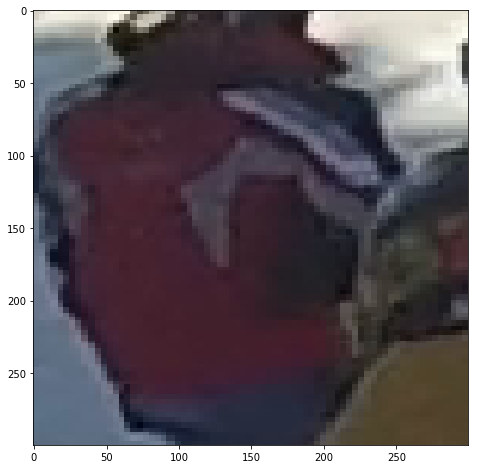

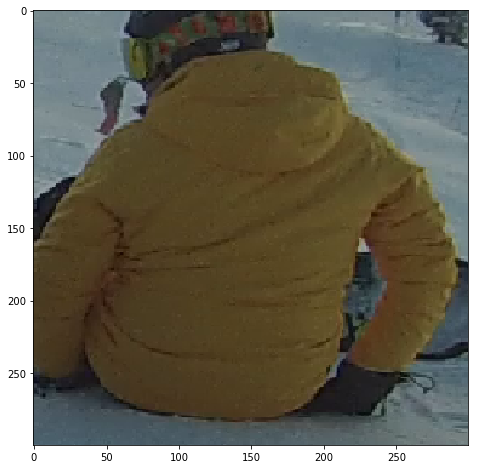

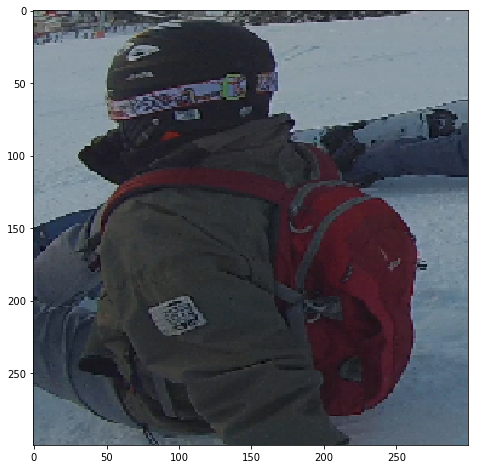

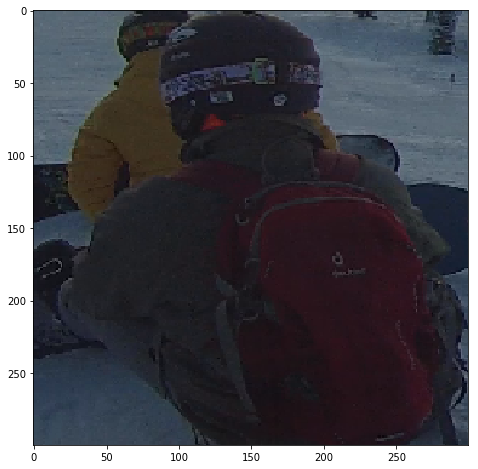

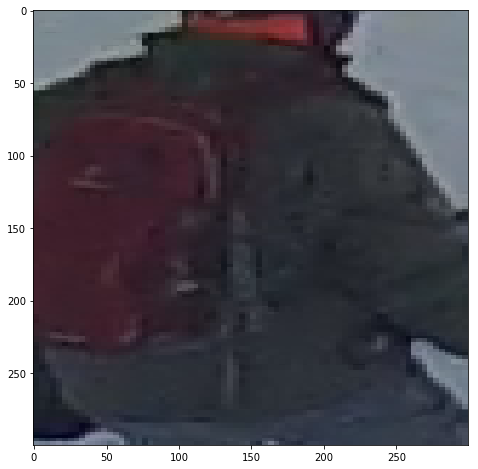

...

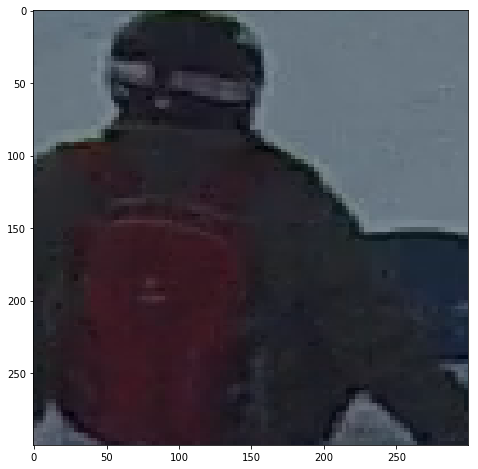

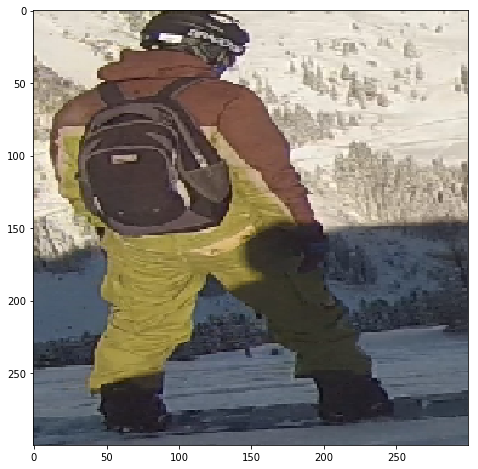

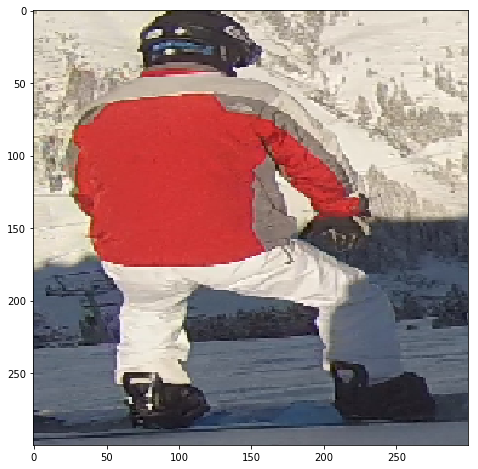

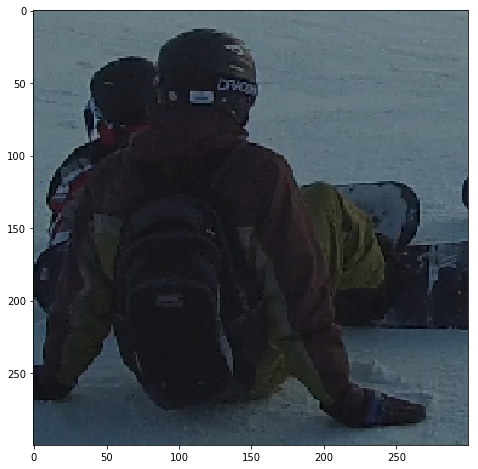

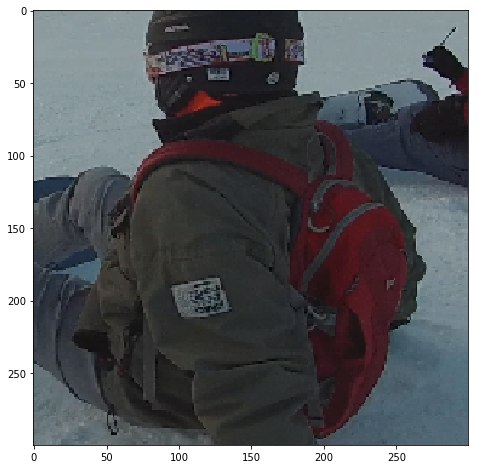

In [304]:
#show some connected xcompenntes
i=1
for i in list(nx.connected_components(G))[4]:
    
    img = image.load_img('/mnt/vidme/vid1/persons/resized'+str(i)+'.png', target_size=(300, 300))
    plot(img)
    plt.show()


In [548]:
close_pics={k: v for k, v in dif_dict.items() if v<=10}

In [551]:
taggings['predicted_encoding']=None

In [555]:
taggings=taggings.set_index(taggings.id)

In [558]:
#{('a','b'):10}
from scipy.cluster.hierarchy import linkage

In [565]:
from scipy.spatial.distance import pdist

In [566]:
Y = pdist([[0,1],[1,0],[1,1],[0,0]], 'euclidean')

In [539]:
from collections import Counter
Counter(dif_dict.values())

Counter({3: 2,
         4: 4,
         5: 12,
         6: 16,
         7: 16,
         8: 30,
         9: 56,
         10: 86,
         11: 100,
         12: 92,
         13: 176,
         14: 176,
         15: 270,
         16: 340,
         17: 448,
         18: 538,
         19: 650,
         20: 674,
         21: 842,
         22: 878,
         23: 848,
         24: 1020,
         25: 1054,
         26: 1110,
         27: 1056,
         28: 1082,
         29: 1064,
         30: 1090,
         31: 986,
         32: 962,
         33: 874,
         34: 808,
         35: 696,
         36: 646,
         37: 586,
         38: 444,
         39: 422,
         40: 308,
         41: 304,
         42: 228,
         43: 176,
         44: 144,
         45: 96,
         46: 96,
         47: 72,
         48: 54,
         49: 28,
         50: 30,
         51: 28,
         52: 6,
         53: 12,
         54: 12,
         55: 6,
         56: 2})

In [417]:
for pair,dif in six.iteritems(dif_dict):
    if dif<10:
        print(pair)

('/mnt/vidme/vid1/persons/resized0.png', '/mnt/vidme/vid1/persons/resized98.png')
('/mnt/vidme/vid1/persons/resized1.png', '/mnt/vidme/vid1/persons/resized116.png')
('/mnt/vidme/vid1/persons/resized1.png', '/mnt/vidme/vid1/persons/resized75.png')
('/mnt/vidme/vid1/persons/resized102.png', '/mnt/vidme/vid1/persons/resized133.png')
('/mnt/vidme/vid1/persons/resized103.png', '/mnt/vidme/vid1/persons/resized115.png')
('/mnt/vidme/vid1/persons/resized103.png', '/mnt/vidme/vid1/persons/resized134.png')
('/mnt/vidme/vid1/persons/resized104.png', '/mnt/vidme/vid1/persons/resized32.png')
('/mnt/vidme/vid1/persons/resized104.png', '/mnt/vidme/vid1/persons/resized98.png')
('/mnt/vidme/vid1/persons/resized105.png', '/mnt/vidme/vid1/persons/resized74.png')
('/mnt/vidme/vid1/persons/resized105.png', '/mnt/vidme/vid1/persons/resized96.png')
('/mnt/vidme/vid1/persons/resized107.png', '/mnt/vidme/vid1/persons/resized36.png')
('/mnt/vidme/vid1/persons/resized107.png', '/mnt/vidme/vid1/persons/resized75.

## clustering error functions

In [502]:
#calinski
from sklearn import metrics
from sklearn import datasets
dataset = datasets.load_iris()
X = dataset.data

y = dataset.target

from sklearn.cluster import KMeans
kmeans_model = KMeans(n_clusters=3, random_state=1).fit(X)
labels = kmeans_model.labels_
metrics.calinski_harabaz_score(X, labels)

560.39992424664024

In [187]:
metrics.homogeneity_completeness_v_measure(enc, labels)

(0.15376682397693425, 0.19184352415284453, 0.17070767451932931)

In [509]:
metrics.fowlkes_mallows_score(labels_true, labels_pred)  

0.47140452079103173

In [34]:
import scipy.spatial.distance as ssd

In [41]:
ar=np.array([[0,1,2],[1,0,2],[2,2,0]])

In [42]:
ssd.squareform(ar)

array([ 1.,  2.,  2.])

In [59]:
np.array(dist_matrix)[:5,:5]

array([[ 0, 18, 11, 16, 37],
       [18,  0, 17, 22, 19],
       [11, 17,  0, 17, 34],
       [16, 22, 17,  0, 31],
       [37, 19, 34, 31,  0]])

In [64]:
arr=ssd.squareform(np.array(dist_matrix)[:5,:5])

In [90]:
from sklearn.metrics.pairwise import pairwise_distances

In [91]:
blobs=[[1,2,3],[4,3,2],[4,5,3],[5,7,6]]

distance_matrix = pairwise_distances(blobs)

In [92]:
distance_matrix

array([[ 0.        ,  3.31662479,  4.24264069,  7.07106781],
       [ 3.31662479,  0.        ,  2.23606798,  5.74456265],
       [ 4.24264069,  2.23606798,  0.        ,  3.74165739],
       [ 7.07106781,  5.74456265,  3.74165739,  0.        ]])

In [95]:
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs
from sklearn.preprocessing import StandardScaler

In [96]:
centers = [[1, 1], [-1, -1], [1, -1]]
X, labels_true = make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)

X = StandardScaler().fit_transform(X)

In [104]:
distance_matrix = pairwise_distances(X)

In [109]:
e=glob.glob('*.png')

In [183]:
hash_dict={}
hash_list=[]
for i in range(148):
    hash_dict[i] = imagehash.average_hash(Image.open('resized'+str(i)+'.png')).hash.flatten()
    hash_list.append(imagehash.average_hash(Image.open('resized'+str(i)+'.png')).hash.flatten())

In [191]:
from sklearn.cluster import KMeans
import numpy as np
kmeans = KMeans(n_clusters=10, random_state=0).fit(hash_list)
labels=kmeans.labels_



In [185]:
enc=taggings.encoding

In [192]:
Counter(labels)

Counter({0: 32, 1: 12, 2: 15, 3: 14, 4: 18, 5: 10, 6: 7, 7: 10, 8: 15, 9: 15})

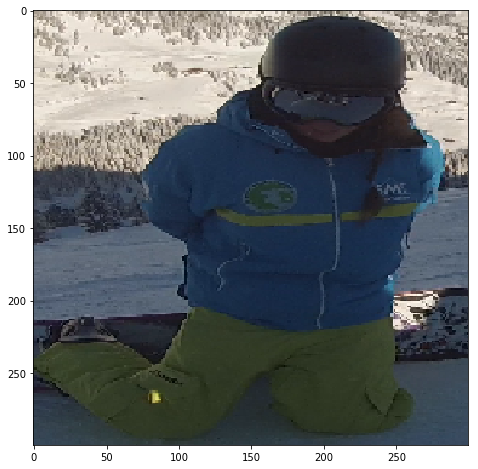

2


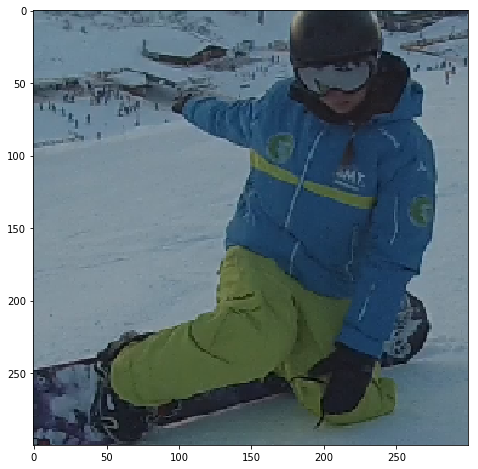

3


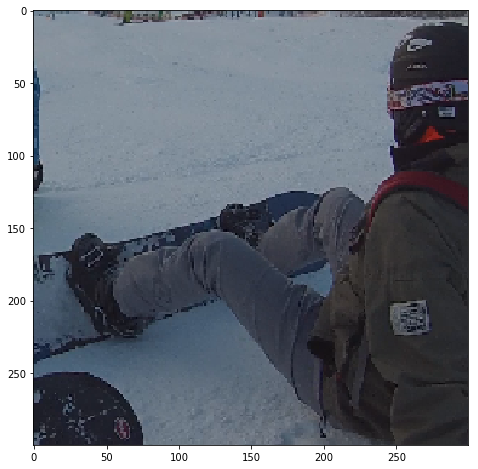

4


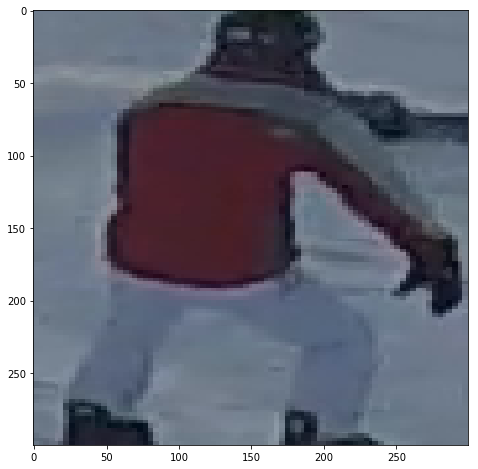

5


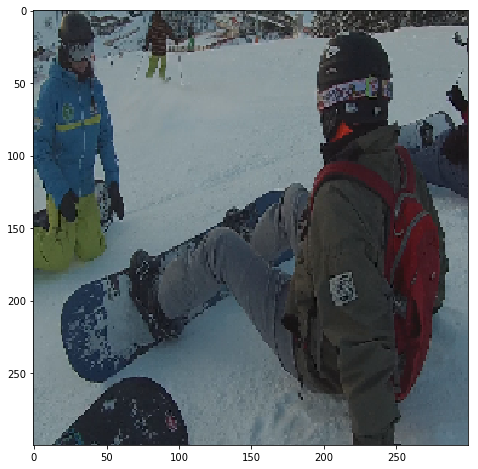

6


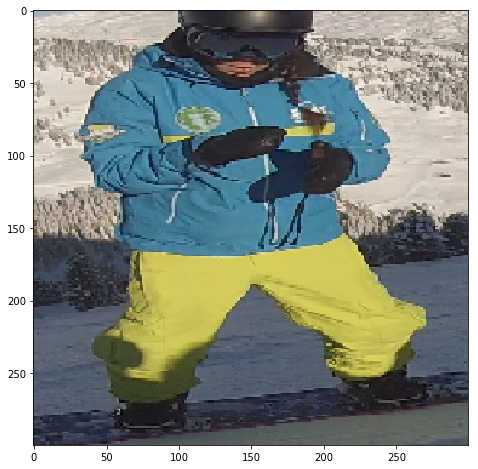

7


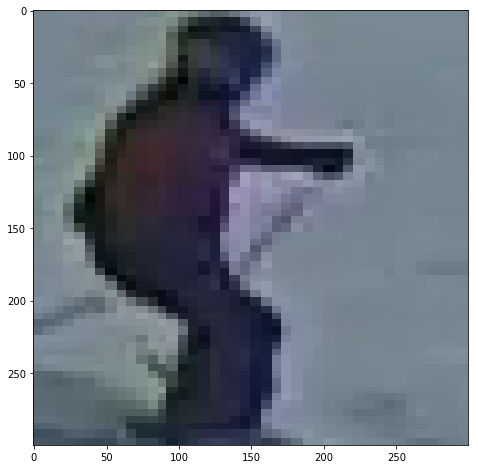

8


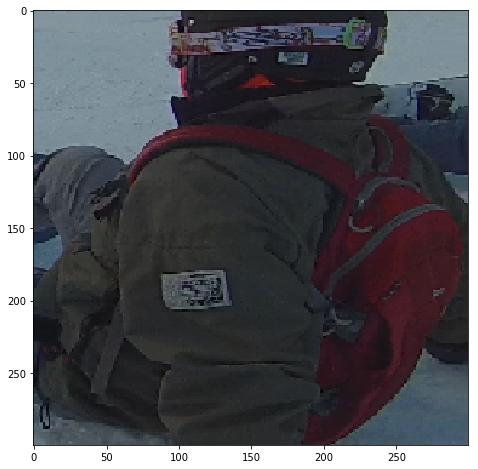

9


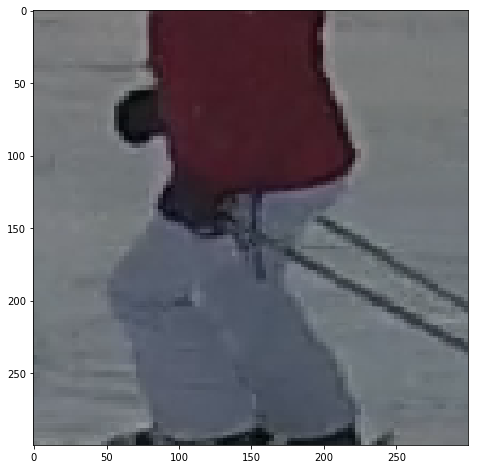

10


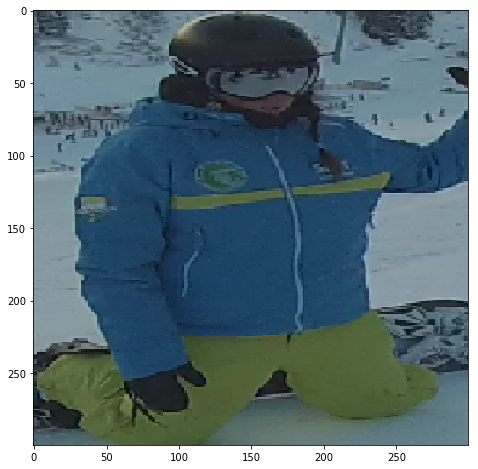

11


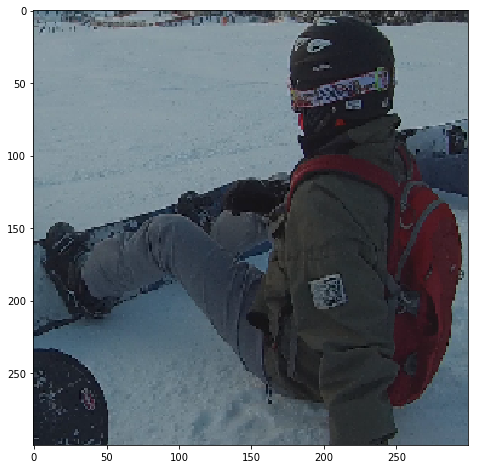

12


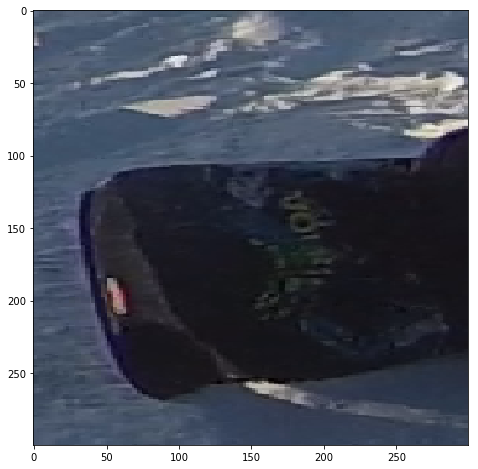

13


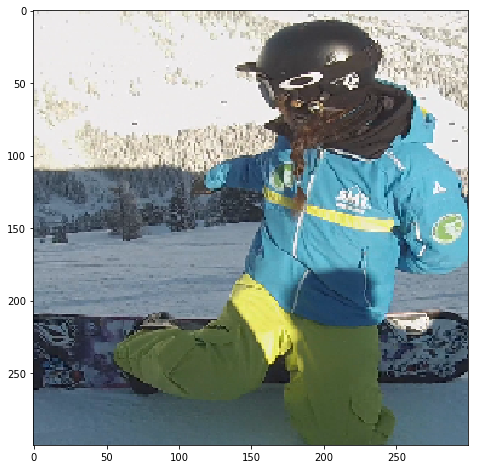

14


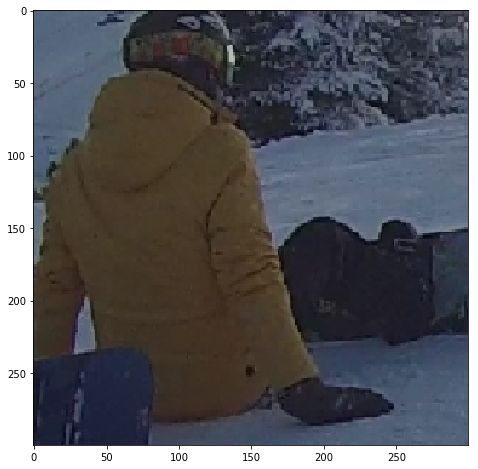

15


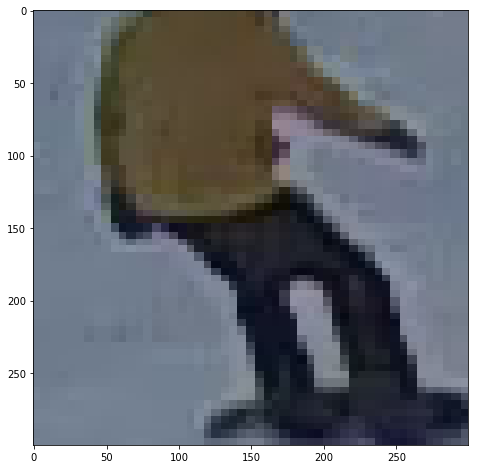

16


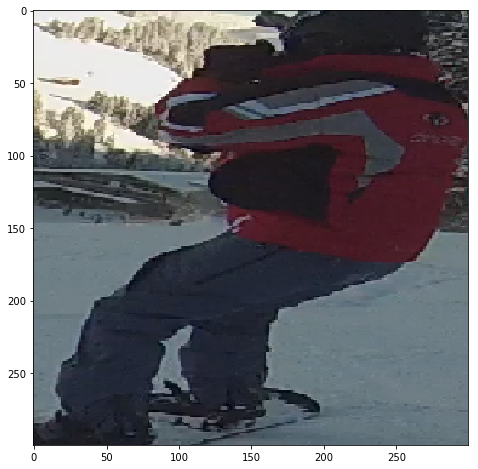

17


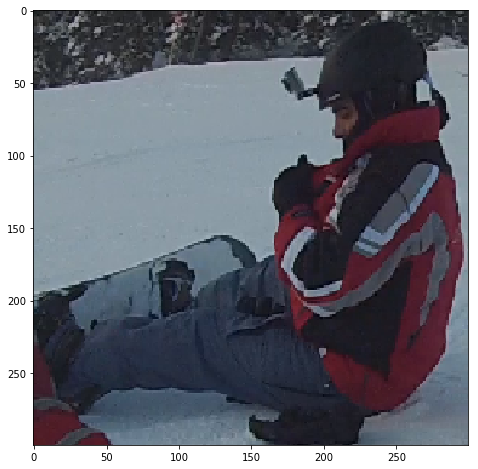

18


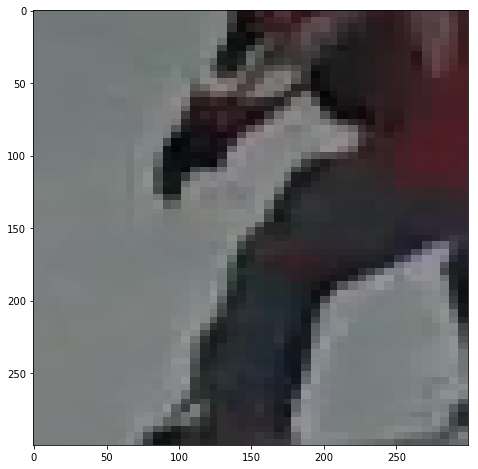

19


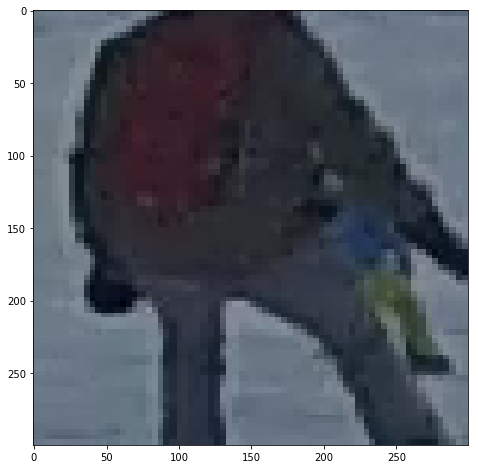

20


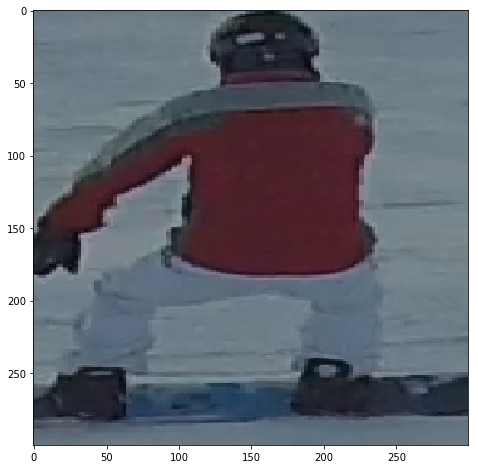

21


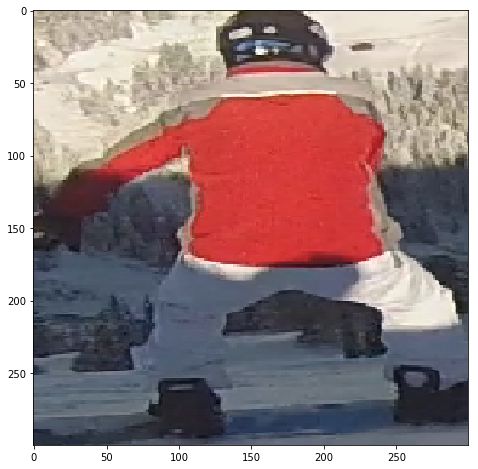

22


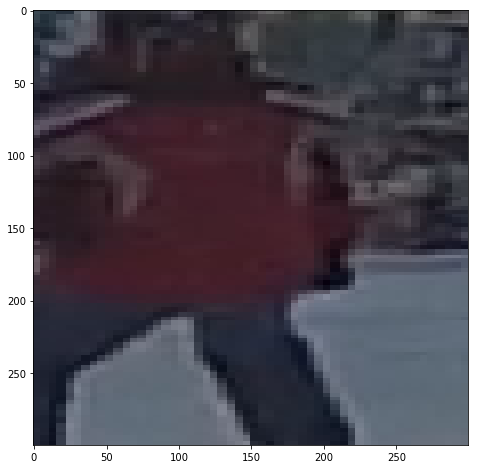

23


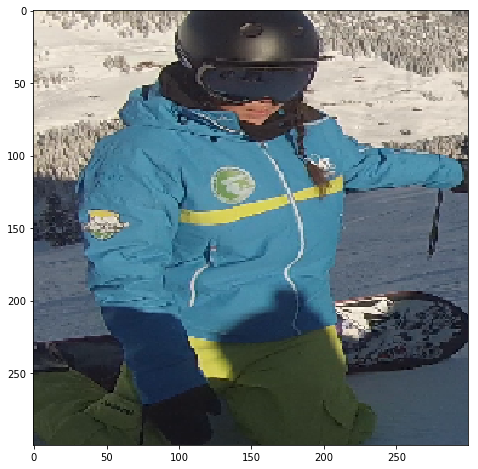

24


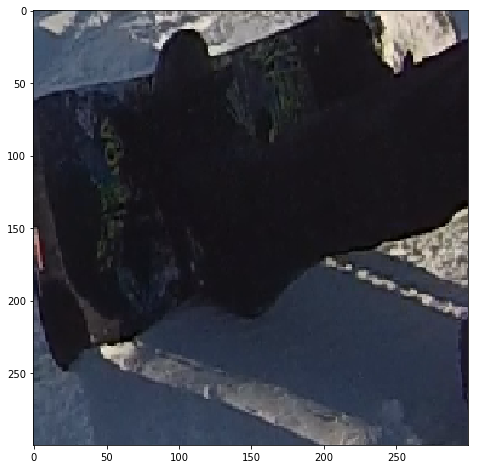

25


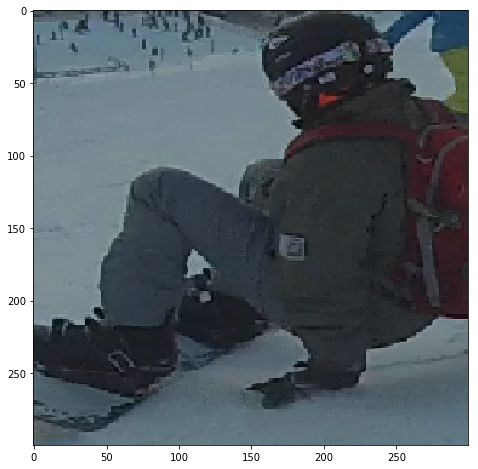

26


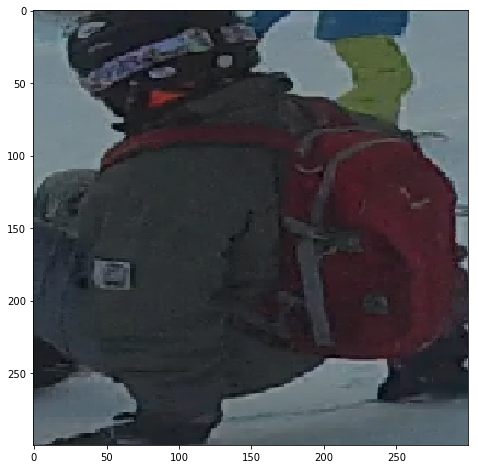

27


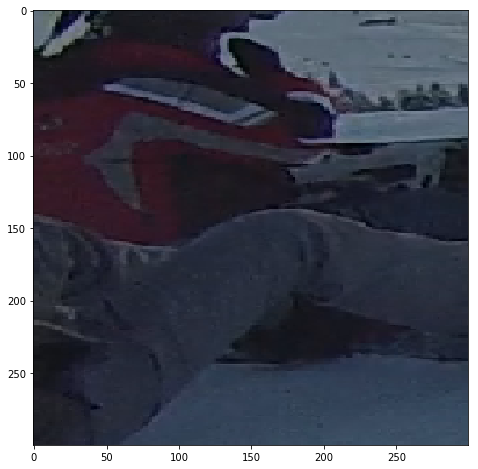

28


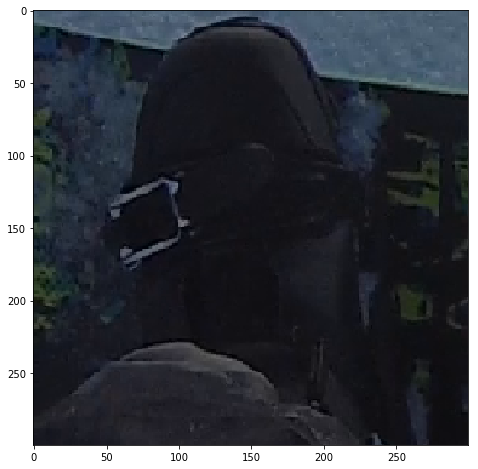

29


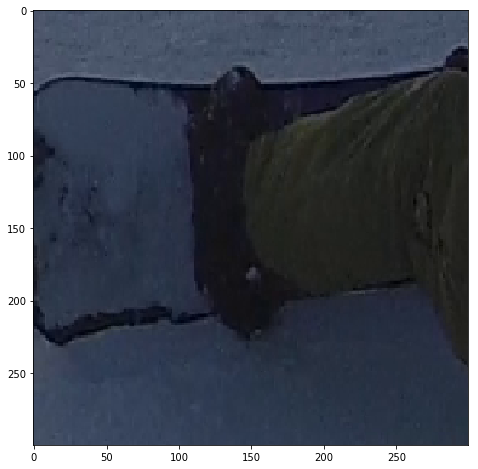

30


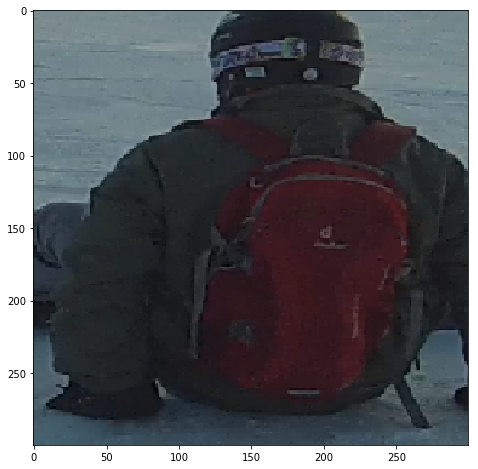

31


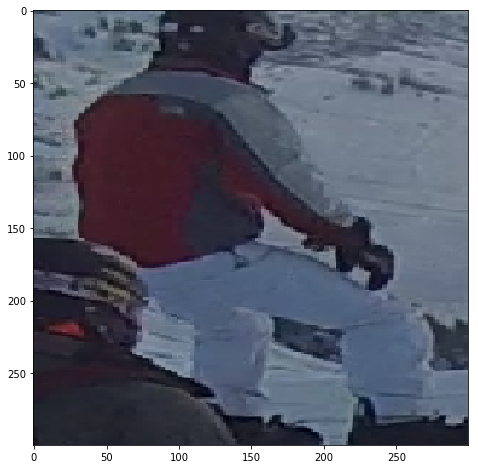

32


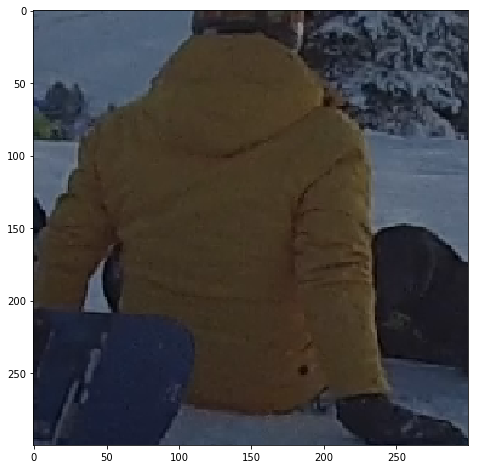

33


In [194]:
i=1
for file in np.array(e)[kmeans.labels_==0]:
    img = image.load_img(file, target_size=(300, 300))
    plot(img)
    plt.show()
    i+=1
    print(i)

In [188]:
#adjusted rank score

metrics.adjusted_rand_score(enc, labels)  

0.087707608153367658

In [189]:
metrics.adjusted_mutual_info_score(enc, labels)  

0.10143764581740806